In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
#Importing required libraries

#for reading and plotting
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#for performance evaluation
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix

#for feature engineering
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# #models
# from sklearn.linear_model import LogisticRegression
# from sklearn.naive_bayes import MultinomialNB
# from sklearn.ensemble import GradientBoostingClassifier
# from sklearn.ensemble import RandomForestClassifier

# #for hyperparameter tuning
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.model_selection import GridSearchCV


import warnings
warnings.filterwarnings('ignore')
import string
import re
import pickle

In [3]:
from imblearn.over_sampling import BorderlineSMOTE, SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import (RandomUnderSampler, 
                                    NearMiss, 
                                    InstanceHardnessThreshold,
                                    CondensedNearestNeighbour,
                                    EditedNearestNeighbours,
                                    RepeatedEditedNearestNeighbours,
                                    AllKNN,
                                    NeighbourhoodCleaningRule,
                                    OneSidedSelection,
                                    TomekLinks)
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.pipeline import make_pipeline

In [5]:
df = pd.read_csv("Reviews.csv")

In [5]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [7]:
df.shape

(568454, 10)

In [8]:
#Distribution of class present in the data

df['Score'].value_counts()

Score
5    363122
4     80655
1     52268
3     42640
2     29769
Name: count, dtype: int64

In [9]:
#checking for null values

df.isnull().sum()

Id                         0
ProductId                  0
UserId                     0
ProfileName               26
HelpfulnessNumerator       0
HelpfulnessDenominator     0
Score                      0
Time                       0
Summary                   27
Text                       0
dtype: int64

In [10]:
df.dropna(axis = 0, how='any', inplace = True) # 0 for row wise  1 for column wise

In [11]:
#looking for duplicate values and treating them

df[df.duplicated(['UserId','ProfileName','Score','Time'])]

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
29,30,B0001PB9FY,A3HDKO7OW0QNK4,Canadian Fan,1,1,5,1107820800,The Best Hot Sauce in the World,I don't know if it's the cactus or the tequila...
426,427,B000G6RYNE,A1Y3XPZK9ZADFW,albinocrow,0,0,4,1334016000,"pretty good, could be better",Glad to find these in a one ounce size but the...
467,468,B000G6RYNE,A3PJZ8TU8FDQ1K,Jared Castle,0,0,5,1231718400,"Crunchy, salty, sweet...finally, a Superbowl s...",These Honey Dijon chips bring a terrific balan...
486,487,B000G6RYNE,A31N6KB160O508,Fran W.,0,0,4,1214006400,Firm quality chip,Just got this order and it is ok. A bit light ...
574,575,B000G6RYNE,A3PJZ8TU8FDQ1K,Jared Castle,2,2,5,1231718400,"One bite and you'll become a ""chippoisseur""","I'm addicted to salty and tangy flavors, so wh..."
...,...,...,...,...,...,...,...,...,...,...
568411,568412,B0018CLWM4,AUX1HSY8FX55S,DAW,1,1,5,1319500800,Happy Camper,I bought this to try on two registered Maine C...
568412,568413,B0018CLWM4,AVZ2OZ479Q9E8,Ai Ling Chow,0,0,5,1336435200,Two Siberians like it!,When we brought home two 3-month-old purebred ...
568413,568414,B0018CLWM4,AI3Y26HLPYW4L,kimosabe,1,2,2,1330041600,premium edge cat food,My cats don't like it. what else can I say to ...
568440,568441,B005ZC0RRO,A2TO5R8QLIITEF,SAK,1,1,5,1323734400,"Delicious, all natural and allergy free treats!",Indie Candy's gummies are absolutely delicious...


In [12]:
#dropping duplicates

df.drop_duplicates(inplace=True, subset=['UserId','ProfileName','Score','Time'] , keep ="first")

In [13]:
df.shape

(368074, 10)

In [14]:
#again checking for null values

df.isnull().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
dtype: int64

In [15]:
df = df[df['HelpfulnessNumerator']<=df['HelpfulnessDenominator']]

In [16]:
#final dataframe shape after de-duplication, null-values treatment and removing noise

df.shape

(368072, 10)

In [17]:
#renaming sentiment score with positive and negative

def renaming_score(x):
    
    return "Positive" if x>=3 else "Negative"

df.loc[:, 'sentiment'] = df.Score.apply(renaming_score)

In [18]:
df['sentiment'].value_counts()

sentiment
Positive    312335
Negative     55737
Name: count, dtype: int64

<Axes: xlabel='sentiment', ylabel='count'>

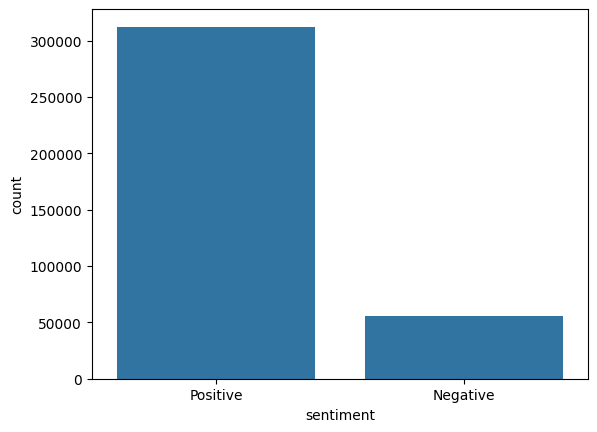

In [19]:
sns.countplot(data=df,x='sentiment') #Highly imbalanced data for the Negative Revies wise

In [20]:
#df1 will be used with class imbalance

df1 = df.copy()

In [21]:
#downsampling the classes taking 40000 random samples of each

positive = df.loc[df.sentiment=="Positive"].sample(4000)

negative = df.loc[df.sentiment=="Negative"].sample(4000)

df = pd.concat([positive, negative])
df.shape

(8000, 11)

In [22]:
import nltk
nltk.download('stopwords')
total_stopwords = set(stopwords.words('english'))

# subtract negative stop words like no, not, don't etc.. from total_stopwords
negative_stop_words = set(word for word in total_stopwords 
                          if "n't" in word or 'no' in word or "n'" in word)

final_stopwords = total_stopwords - negative_stop_words


#final_stopwords.add("one")
print(final_stopwords)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ROHIT\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


{"i'm", 'being', 'for', 'when', 'we', 'yours', 'any', 'ma', 'their', 'himself', 'are', "you've", 'be', "we're", 'isn', 'so', 'again', 'were', 'about', 'up', 'further', 'down', 'only', 'is', 'and', 'an', "you'll", 'doesn', 've', 'couldn', "we've", 'by', 'under', "he's", 'this', 'such', 'to', 'him', 'than', 'before', 'while', 'the', 'hers', 'yourselves', "it'll", 'where', "he'd", 'didn', 'i', 'a', "she'll", 'll', 'my', 'there', 'how', 'own', 'on', 'during', "it'd", 'most', 'it', 'those', 'against', 'into', 'does', 'itself', 'each', "i've", 'all', 'wouldn', 're', 'mightn', "they've", 'o', 'can', 'had', "i'd", 'as', 'shouldn', 'do', 't', 'why', 'then', 'once', 'doing', 'who', 'few', 'wasn', 'more', 'between', 'here', 'me', 'he', 'just', 'at', "he'll", 'herself', 'her', 'shan', "they'd", 'she', 'haven', "she's", 'in', 'won', "we'd", 'you', 'from', 'been', 'these', 'myself', 'very', 'some', 'hadn', 'ourselves', 'after', 'ours', 'if', 'its', 'above', 'until', 'out', 'themselves', 'his', 'was'

In [23]:
negative_stop_words

{"aren't",
 "couldn't",
 "didn't",
 "doesn't",
 "don't",
 "hadn't",
 "hasn't",
 "haven't",
 "isn't",
 "mightn't",
 "mustn't",
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 "shan't",
 "shouldn't",
 "wasn't",
 "weren't",
 "won't",
 "wouldn't"}

In [24]:
import re
import nltk
from nltk.stem import WordNetLemmatizer

#from nltk.corpus import stopwords
stop = final_stopwords

#initialising the wordnet Lemmatizer
lemmatizer = WordNetLemmatizer()                      

#function to clean the word of any html-tags
def cleanhtml(sentence): 
    
    cleanr = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext

#function to clean the word of any punctuation or special characters
def cleanpunc(sentence): 
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned


#function to text summarization
def final_sentence(text):
    
    text = text.split()
    text = [cleanhtml(x) for x in text]
    text = [cleanpunc(x) for x in text]
    
    def test(word):
        if word.isalpha() and len(word) > 2 and word.lower() not in stop:
            s=(lemmatizer.lemmatize(word.lower()))
            return s
        else:
            pass
    text = [test(x) for x in text if test(x)]
    
    return ' '.join(text)


In [25]:
from tqdm import tqdm
tqdm.pandas()

df['CleanedText'] = df['Text'].progress_apply(final_sentence)
df1['CleanedText'] = df1['Text'].progress_apply(final_sentence)
print(df.shape)
print(df1.shape)


  0%|          | 0/8000 [00:00<?, ?it/s]

100%|██████████| 368072/368072 [02:51<00:00, 2150.44it/s]

(8000, 12)
(368072, 12)


In [26]:
#word cloud

In [27]:
from wordcloud import WordCloud, STOPWORDS

In [28]:
def generate_wcloud(text):
    wordcloud = WordCloud(background_color='white')
    wordcloud.generate(text)
    plt.figure(figsize=(15,7))
    plt.axis('off')
    plt.imshow(wordcloud, interpolation='bilinear')
    return plt.show()

In [33]:
df1["CleanedText"].replace('<br />' , '')

0         bought several vitality canned dog food produc...
1         product arrived labeled jumbo salted peanut ac...
2         confection around pillowy citrus gelatin nut c...
3         looking secret ingredient robitussin believe f...
4         great taffy great wide assortment yummy delive...
                                ...                        
568449    great sesame good not better resturants eaten ...
568450    disappointed chocolate note especially milk th...
568451    star give one training tried train dog ceaser ...
568452    best treat training rewarding dog good lower c...
568453                            satisfied use raw general
Name: CleanedText, Length: 368077, dtype: object

In [ ]:
#Positive Reviews

In [6]:
pos = df1.loc[df1.sentiment=="Positive"].CleanedText

NameError: name 'df1' is not defined

In [40]:
text = " ".join(review for review in pos.astype(str))

In [41]:
pos[0:10]

0     bought several vitality canned dog food produc...
2     confection around pillowy citrus gelatin nut c...
4     great taffy great wide assortment yummy delive...
5     got wild hair taffy ordered five pound taffy e...
6     saltwater taffy great flavor soft candy indivi...
7     taffy soft flavor would definitely recommend b...
8     right now mostly sprouting cat eat love rotate...
9     healthy dog good also good small dog eats requ...
10    dont know cactus tequila unique combination fl...
11    one boy needed lose weight put food floor chub...
Name: CleanedText, dtype: object

In [36]:
text

'I have a 4 year old, 20 lbs Boston Terrier male.  Little man was entertained for almost 2 hours with the treat ball.  Loved it! This is the bomb, tuna bomb.<br />This is the product i gave my tuna virginity to. As its Skipjack its safe too. I\'d say it has almost the same taste as Albacore from same producer. Now i am gonna try Tongol tuna and see how it goes. I\'ve been eating Lindt 85% dark chocolate as a healthy treat for a while now and have a pretty good feel for what that chocolate is like.  I expected the 90% to be somewhat similar to that, only stronger, but I was very wrong.<br /><br />Lindt 90% has a drier, more chalky composition than the 85%.  It also has hints of what tastes like marshmallow (though I\'m sure it\'s something else).  The 85% by contrast, is creamier with a strong, organic woody flavor.  The 85% comes across as a more traditional dark chocolate while the 90% seems like a different product all together.  I will say thought that the 90% seems to lack the "bit

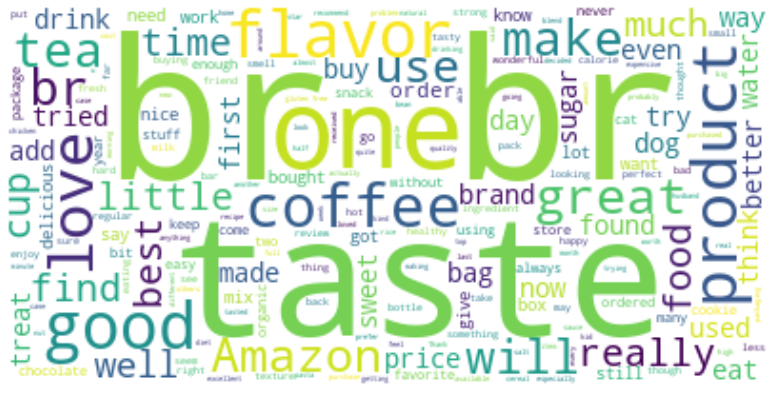

In [44]:
pos = df.loc[df.sentiment=="Positive"].Text
text = " ".join(review for review in pos.astype(str))

generate_wcloud(text)

In [38]:
#Negative Reviews

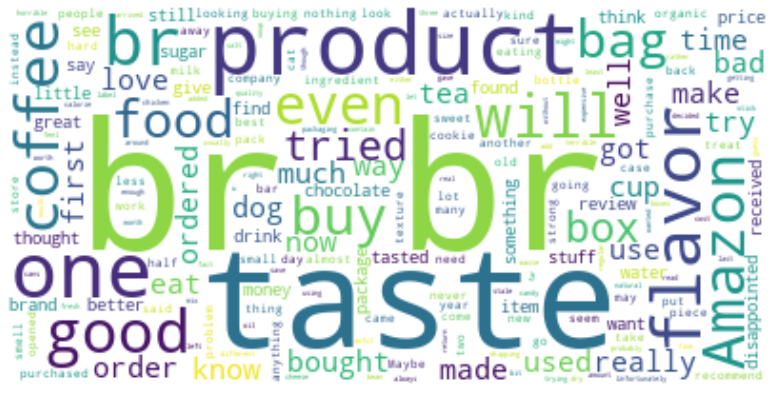

In [ ]:
pos = df.loc[df.sentiment=="Negative"].Text
text = " ".join(review for review in pos.astype(str))
generate_wcloud(text)

# Model Building 

In [26]:
from sklearn.model_selection import train_test_split
#X = df.CleanedText
#y = df.sentiment

X1 = df1.CleanedText
y1 = df1.sentiment

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.20)

In [27]:
print(X1_train.shape)
print(X1_test.shape)
print(y1_train.shape)
print(y1_test.shape)


(294461,)
(73616,)
(294461,)
(73616,)


In [28]:
y1_train.value_counts()

Positive    249877
Negative     44584
Name: sentiment, dtype: int64

In [29]:
from sklearn import preprocessing
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder()
# Encode labels in column 'Country'. 
y1_train = label_encoder.fit_transform(y1_train) 
print(y1_train)

[1 1 1 ... 1 0 0]


In [30]:
from sklearn import preprocessing
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder()
# Encode labels in column 'Country'. 
y1_test = label_encoder.fit_transform(y1_test) 
print(y1_test)

[1 1 1 ... 1 0 1]


In [31]:
y1_test = pd.DataFrame(y1_test)

In [32]:
y1_test.value_counts()

1    62463
0    11153
dtype: int64

In [33]:
y1_train = pd.DataFrame(y1_train)

In [34]:
y1_train.value_counts()

1    249877
0     44584
dtype: int64

In [35]:
# transformation using tf-idf
tfidf_vectorizer = TfidfVectorizer(max_features=10000)
tfidf_vectorizer.fit(X1_train)

# transform
#tfidf_X_train = tfidf_vectorizer.transform(X_train)
#tfidf_X_test = tfidf_vectorizer.transform(X_test)
tfidf_X1_train = tfidf_vectorizer.transform(X1_train)
tfidf_X1_test = tfidf_vectorizer.transform(X1_test)

In [36]:
#Smote on Training Dataset with TFIDF

In [37]:
#SMOTE on Training data only 
sm = SMOTE(sampling_strategy='minority')
sm_xtrain_tfidf, sm_train_y = sm.fit_resample(tfidf_X1_train, y1_train)


In [47]:
sm_train_y.value_counts()

0    249877
1    249877
dtype: int64

In [ ]:
# sm_xtrain_tfidf, sm_train_y -Training data #Smote Applied on Training data Only
# tfidf_X1_test ,  y1_test - Testing data #Smote not applied on testing data


In [54]:
# Implementing Bag Of Words
bow_vectorizer = CountVectorizer(max_features=10000)
bow_vectorizer1 = CountVectorizer(max_features=10000)
#bow_vectorizer.fit(X_train)
bow_vectorizer1.fit(X1_train) #.fit_transform() on training data and only transform on test data
# transformation
#bow_X_train = bow_vectorizer.transform(X_train)
#bow_X_test = bow_vectorizer.transform(X_test)
bow_X1_train = bow_vectorizer1.transform(X1_train)
bow_X1_test = bow_vectorizer1.transform(X1_test)

In [55]:
#SMOTE on Training data only with BOW
sm = SMOTE(sampling_strategy='minority')
sm_xtrain_bow, sm_train_y_bow = sm.fit_resample(bow_X1_train, y1_train)

In [ ]:
#sm_xtrain_bow, sm_train_y_bow  - Training data
#bow_X1_test , y1_test -Testing data

In [38]:
sm_train_y.value_counts()

0    249877
1    249877
dtype: int64

In [80]:
#Logistic regression with GridsearchCV with TF-IDF
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')
# parameter grid
parameters = {
    'penalty' : ['l2'], 
    'C'       : [0.001, 0.01, 0.1, 1, 10],
    'solver'  : [ 'lbfgs'],
}



In [79]:
logreg = LogisticRegression()
clf = GridSearchCV(logreg,                    # model
                   param_grid = parameters,   # hyperparameters
                   scoring='accuracy',        # metric for scoring
                   cv=10)                     # number of folds

In [81]:
clf.fit(sm_xtrain_tfidf,sm_train_y)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2'], 'solver': ['lbfgs']},
             scoring='accuracy')

In [82]:
print("Tuned Hyperparameters :", clf.best_params_)
print("Accuracy :",clf.best_score_)

Tuned Hyperparameters : {'C': 10.0, 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy : 0.8849058425230586


In [86]:
y_pred = clf.predict(tfidf_X1_test)

In [88]:
from sklearn.metrics import classification_report
print(classification_report(y1_test, y_pred))

              precision    recall  f1-score   support

           0       0.52      0.80      0.63     11132
           1       0.96      0.87      0.91     62484

    accuracy                           0.86     73616
   macro avg       0.74      0.83      0.77     73616
weighted avg       0.89      0.86      0.87     73616



In [ ]:
#lets Apply SMOTE on Testing data as well as training data and thus check for the results for one model

In [96]:
#Logistic regression with GridsearchCV with BOW
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')
# parameter grid
parameters = {
    'penalty' : ['l2'], 
    'C'       : [0.001, 0.01, 0.1, 1, 10],
    'solver'  : [ 'lbfgs'],
}

In [97]:
logreg = LogisticRegression()
clf_lrbow = GridSearchCV(logreg,                    # model
                   param_grid = parameters,   # hyperparameters
                   scoring='accuracy',        # metric for scoring
                   cv=10)                     # number of folds

In [104]:
clf_lrbow.fit(sm_xtrain_bow, sm_train_y_bow)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10], 'penalty': ['l2'],
                         'solver': ['lbfgs']},
             scoring='accuracy')

In [105]:
print("Tuned Hyperparameters :", clf_lrbow.best_params_)
print("Accuracy :",clf_lrbow.best_score_)

Tuned Hyperparameters : {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy : 0.9022721958853002


In [106]:
y_pred_bow = clf_lrbow.predict(bow_X1_test)

In [107]:
from sklearn.metrics import classification_report
print(classification_report(y1_test, y_pred_bow))

              precision    recall  f1-score   support

           0       0.52      0.71      0.60     11132
           1       0.94      0.88      0.91     62484

    accuracy                           0.86     73616
   macro avg       0.73      0.79      0.75     73616
weighted avg       0.88      0.86      0.86     73616



In [39]:
#Naive Bayes With TFIDF with GridSearchCV
from sklearn.naive_bayes import MultinomialNB

In [40]:
# parameter grid
parameters = {
    "alpha" : [0, 0.2, 0.6, 0.8, 1]
    
             }
nb_model = MultinomialNB()
nb_TFIDF = GridSearchCV(nb_model,                    # model
                   param_grid = parameters,   # hyperparameters
                   scoring='accuracy',        # metric for scoring
                   cv = 10)                     # number of folds


In [41]:
nb_TFIDF.fit(sm_xtrain_tfidf,sm_train_y)

GridSearchCV(cv=10, estimator=MultinomialNB(),
             param_grid={'alpha': [0, 0.2, 0.6, 0.8, 1]}, scoring='accuracy')

In [42]:
print("Tuned Hyperparameters :", nb_TFIDF.best_params_)
print("Accuracy :",nb_TFIDF.best_score_)

Tuned Hyperparameters : {'alpha': 1}
Accuracy : 0.8508106404330708


In [44]:
y_pred_nb_TFIDF = nb_TFIDF.predict(tfidf_X1_test)

In [46]:
from sklearn.metrics import classification_report
print(classification_report(y1_test,y_pred_nb_TFIDF ))

              precision    recall  f1-score   support

           0       0.48      0.81      0.60     11153
           1       0.96      0.84      0.90     62463

    accuracy                           0.84     73616
   macro avg       0.72      0.83      0.75     73616
weighted avg       0.89      0.84      0.85     73616



In [ ]:
#SMOTE on Testing data also
sm = SMOTE(sampling_strategy='minority')
sm_xtest_tfidf, sm_test_y = sm.fit_resample(tfidf_X1_test ,  y1_test)

In [49]:
y_pred_nb_TFIDF_smtest = nb_TFIDF.predict(sm_xtest_tfidf)

In [50]:
print(classification_report(sm_test_y ,y_pred_nb_TFIDF_smtest ))

              precision    recall  f1-score   support

           0       0.84      0.84      0.84     62463
           1       0.84      0.84      0.84     62463

    accuracy                           0.84    124926
   macro avg       0.84      0.84      0.84    124926
weighted avg       0.84      0.84      0.84    124926



In [ ]:
#Naive Bayes With BOW with GridSearchCV
from sklearn.naive_bayes import MultinomialNB

In [51]:
# parameter grid
parameters = {
    "alpha" : [0, 0.2, 0.6, 0.8, 1]
    
             }
nb_bow_model = MultinomialNB()
nb_BOW = GridSearchCV(nb_bow_model,                    # model
                   param_grid = parameters,   # hyperparameters
                   scoring='accuracy',        # metric for scoring
                   cv = 10)                     # number of folds

In [56]:
nb_BOW.fit(sm_xtrain_bow, sm_train_y_bow)

GridSearchCV(cv=10, estimator=MultinomialNB(),
             param_grid={'alpha': [0, 0.2, 0.6, 0.8, 1]}, scoring='accuracy')

In [57]:
print("Tuned Hyperparameters :", nb_BOW.best_params_)
print("Accuracy :",nb_BOW.best_score_)

Tuned Hyperparameters : {'alpha': 0.6}
Accuracy : 0.8572860209118487


In [58]:
y_pred_nb_BOW = nb_BOW.predict(bow_X1_test )

In [59]:
from sklearn.metrics import classification_report
print(classification_report(y1_test, y_pred_nb_BOW))

              precision    recall  f1-score   support

           0       0.52      0.69      0.59     11153
           1       0.94      0.88      0.91     62463

    accuracy                           0.85     73616
   macro avg       0.73      0.79      0.75     73616
weighted avg       0.88      0.85      0.86     73616



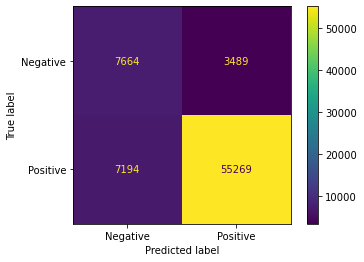

In [62]:
import matplotlib.pyplot as plt
import numpy
from sklearn import metrics

actual = y1_test
predicted = y_pred_nb_BOW

confusion_matrix = metrics.confusion_matrix(actual, predicted)

cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ["Negative", "Positive"])

cm_display.plot()
plt.show()

In [ ]:
#RandomForest Model with TFIDF

In [65]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
             }
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search_rf = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid_search_rf.fit(sm_xtrain_tfidf, sm_train_y)
grid_search_rf.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


In [34]:
# Implementing Bag Of Words
bow_vectorizer = CountVectorizer(max_features=10000)
bow_vectorizer1 = CountVectorizer(max_features=10000)
bow_vectorizer.fit(X_train)
bow_vectorizer1.fit(X1_train)
# transformation
bow_X_train = bow_vectorizer.transform(X_train)
bow_X_test = bow_vectorizer.transform(X_test)
bow_X1_train = bow_vectorizer1.transform(X1_train)
bow_X1_test = bow_vectorizer1.transform(X1_test)

In [32]:
bow_X_train

array(<64000x10000 sparse matrix of type '<class 'numpy.int64'>'
	with 1735784 stored elements in Compressed Sparse Row format>,
      dtype=object)

In [47]:

bow_vectorizer.vocabulary_

{'switch': 8620,
 'son': 8085,
 'enfamil': 2809,
 'infant': 4350,
 'look': 5019,
 'organ': 6053,
 'decid': 2188,
 'tri': 9076,
 'earth': 2674,
 'best': 738,
 'although': 215,
 'would': 9857,
 'drink': 2594,
 'within': 9812,
 'next': 5760,
 'day': 2154,
 'keep': 4655,
 'formula': 3321,
 'finish': 3164,
 'supplement': 8541,
 'appl': 344,
 'juic': 4603,
 'pear': 6338,
 'pure': 6900,
 'help': 3990,
 'four': 3337,
 'later': 4818,
 'still': 8351,
 'terribl': 8793,
 'chang': 1385,
 'babi': 544,
 'one': 6002,
 'normal': 5828,
 'bowel': 943,
 'realli': 7040,
 'disappoint': 2392,
 'harsh': 3898,
 'think': 8856,
 'intent': 4433,
 'good': 3625,
 'obvious': 5944,
 'isnt': 4494,
 'complet': 1752,
 'trade': 9036,
 'read': 7028,
 'extra': 2990,
 'fortifi': 3326,
 'lactos': 4771,
 'make': 5134,
 'difficult': 2353,
 'children': 1477,
 'take': 8671,
 'well': 9686,
 'continu': 1851,
 'sinc': 7878,
 'better': 745,
 'serious': 7701,
 'tast': 8717,
 'yummi': 9960,
 'baffl': 562,
 'get': 3524,
 'much': 5588,


In [43]:
bow_vectorizer.get_feature_names_out()[0:50]

array(['aafco', 'aback', 'abalon', 'abandon', 'abbi', 'abc', 'abdomen',
       'abdomin', 'abid', 'abil', 'abl', 'abnorm', 'abomin', 'abound',
       'abroad', 'absenc', 'absent', 'absinth', 'absolut', 'absolutley',
       'absorb', 'absorpt', 'abstain', 'absurd', 'abt', 'abund', 'abus',
       'abut', 'abysm', 'acacia', 'academi', 'acai', 'acana', 'acceler',
       'accent', 'accentu', 'accept', 'access', 'accessori', 'accid',
       'accident', 'acclim', 'accommod', 'accompani', 'accomplish',
       'accord', 'account', 'accross', 'accumul', 'accur'], dtype=object)

In [48]:
len(bow_vectorizer.get_feature_names_out())

10000

In [49]:
# transformation using tf-idf
tfidf_vectorizer = TfidfVectorizer(max_features=10000)
tfidf_vectorizer.fit(X_train)

# transform
tfidf_X_train = tfidf_vectorizer.transform(X_train)
tfidf_X_test = tfidf_vectorizer.transform(X_test)
tfidf_X1_train = tfidf_vectorizer.transform(X1_train)
tfidf_X1_test = tfidf_vectorizer.transform(X1_test)

In [50]:
tfidf_vectorizer.vocabulary_

{'switch': 8620,
 'son': 8085,
 'enfamil': 2809,
 'infant': 4350,
 'look': 5019,
 'organ': 6053,
 'decid': 2188,
 'tri': 9076,
 'earth': 2674,
 'best': 738,
 'although': 215,
 'would': 9857,
 'drink': 2594,
 'within': 9812,
 'next': 5760,
 'day': 2154,
 'keep': 4655,
 'formula': 3321,
 'finish': 3164,
 'supplement': 8541,
 'appl': 344,
 'juic': 4603,
 'pear': 6338,
 'pure': 6900,
 'help': 3990,
 'four': 3337,
 'later': 4818,
 'still': 8351,
 'terribl': 8793,
 'chang': 1385,
 'babi': 544,
 'one': 6002,
 'normal': 5828,
 'bowel': 943,
 'realli': 7040,
 'disappoint': 2392,
 'harsh': 3898,
 'think': 8856,
 'intent': 4433,
 'good': 3625,
 'obvious': 5944,
 'isnt': 4494,
 'complet': 1752,
 'trade': 9036,
 'read': 7028,
 'extra': 2990,
 'fortifi': 3326,
 'lactos': 4771,
 'make': 5134,
 'difficult': 2353,
 'children': 1477,
 'take': 8671,
 'well': 9686,
 'continu': 1851,
 'sinc': 7878,
 'better': 745,
 'serious': 7701,
 'tast': 8717,
 'yummi': 9960,
 'baffl': 562,
 'get': 3524,
 'much': 5588,


In [51]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.


In [52]:
from gensim.models import Word2Vec

In [53]:
#Word to Vec implementation

In [54]:
sentences = [nltk.word_tokenize(sentence) for sentence in X_train]

for i in range(len(sentences)):
    sentences[i] = [word for word in sentences[i] if word not in stop]
    

In [56]:
sentences

[['switch',
  'son',
  'enfamil',
  'infant',
  'look',
  'organ',
  'decid',
  'tri',
  'earth',
  'best',
  'although',
  'son',
  'would',
  'drink',
  'within',
  'next',
  'day',
  'decid',
  'keep',
  'tri',
  'formula',
  'finish',
  'supplement',
  'appl',
  'juic',
  'appl',
  'pear',
  'pure',
  'help',
  'four',
  'day',
  'later',
  'still',
  'terribl',
  'decid',
  'chang',
  'babi',
  'one',
  'within',
  'day',
  'normal',
  'look',
  'bowel',
  'realli',
  'disappoint',
  'formula',
  'harsh',
  'think',
  'intent',
  'good',
  'obvious',
  'isnt',
  'complet',
  'trade',
  'read',
  'extra',
  'fortifi',
  'formula',
  'lactos',
  'make',
  'difficult',
  'children',
  'son',
  'take',
  'realli',
  'well',
  'babi',
  'continu',
  'formula',
  'sinc',
  'better'],
 ['serious',
  'tast',
  'yummi',
  'baffl',
  'get',
  'much',
  'protein',
  'yet',
  'still',
  'consist',
  'milk',
  'admit',
  'not',
  'fan',
  'low',
  'cal',
  'tast',
  'artif',
  'someth',
  'hon

In [57]:
model = Word2Vec(sentences, min_count=1)

In [116]:
vector = model.wv['sad']

In [117]:
vector

array([ 0.05815151,  0.33791298, -0.89351714, -0.12778589, -0.6366018 ,
       -0.8858044 ,  0.42624667,  0.07873832, -0.35794526, -0.2356316 ,
       -0.04530282,  0.13779081,  0.06454904,  0.29682073,  0.30263767,
       -0.6504327 ,  0.08930502, -0.35233903, -0.53913575,  0.22057433,
       -0.2695698 , -0.20446303,  0.50745577, -0.4985918 ,  0.13735363,
       -0.13895996,  0.02679244,  0.29490438, -0.4994971 , -0.03515468,
        0.37634403, -0.0033493 ,  0.37518418, -0.15411963, -0.03816663,
        0.10967614,  0.11004209,  0.1172757 , -0.47468138, -0.33399174,
        0.15518828, -0.10481352, -0.46130267, -0.1290972 ,  0.31563762,
       -0.20374998,  0.17385502, -0.304901  ,  0.03032984, -0.117619  ,
        0.27023837, -0.38588136, -0.09630705, -0.45371148,  0.2593738 ,
        0.16652603,  0.04116703,  0.06365755, -0.760098  ,  0.7463747 ,
       -0.1845106 , -0.4587434 ,  0.4914303 , -0.43704885, -0.5503514 ,
        0.13947277, -0.6068659 ,  0.26902723, -0.39351085,  0.58

In [60]:
len(vector)

100

In [122]:
similar = model.wv.most_similar('bought')
similar

[('purchas', 0.6827516555786133),
 ('pick', 0.5702213048934937),
 ('saw', 0.5362796783447266),
 ('discov', 0.51677405834198),
 ('order', 0.511787474155426),
 ('penney', 0.5084246397018433),
 ('carniceria', 0.499301940202713),
 ('brought', 0.49656060338020325),
 ('sold', 0.48659470677375793),
 ('got', 0.4791378378868103)]

In [97]:
# Defining model for future

def train_and_eval(model, trainX, trainY, testX, testY):

    # training
    _ = model.fit(trainX, trainY)

    # predictions
    y_preds_train = model.predict(trainX)
    y_preds_test = model.predict(testX)

    # evaluation
    print()
    print(model)
    print(f"Train accuracy score : {accuracy_score(trainY, y_preds_train)}")
    print(f"Test accuracy score : {accuracy_score(testY, y_preds_test)}")
    print(classification_report(testY, y_preds_test))
    print('\n',40*'-')

In [99]:
from sklearn.metrics import classification_report
# Hyperparameters
C = [0.001, 0.01, 0.1, 1, 10]

for c in C: 
    # Define model
    log_model = LogisticRegression(C=c, max_iter=500, random_state=1)
    
    # Train and evaluate model
    train_and_eval(model=log_model,
                   trainX=bow_X_train,
                   trainY=y_train,
                   testX=bow_X_test,
                   testY=y_test)


LogisticRegression(C=0.001, max_iter=500, random_state=1)
Train accuracy score : 0.80265625
Test accuracy score : 0.802625
              precision    recall  f1-score   support

    Negative       0.80      0.81      0.80      8000
    Positive       0.81      0.80      0.80      8000

    accuracy                           0.80     16000
   macro avg       0.80      0.80      0.80     16000
weighted avg       0.80      0.80      0.80     16000


 ----------------------------------------

LogisticRegression(C=0.01, max_iter=500, random_state=1)
Train accuracy score : 0.839328125
Test accuracy score : 0.8309375
              precision    recall  f1-score   support

    Negative       0.83      0.84      0.83      8000
    Positive       0.83      0.83      0.83      8000

    accuracy                           0.83     16000
   macro avg       0.83      0.83      0.83     16000
weighted avg       0.83      0.83      0.83     16000


 ----------------------------------------

LogisticRe

In [102]:
# Hyperparameters
C = [0.001, 0.01, 0.1, 1, 10]

for c in C:
    log_model = LogisticRegression(C=c, max_iter=500)
  # Train and evaluate model
    train_and_eval(model=log_model, 
                   trainX=bow_X1_train,
                   trainY=y1_train,
                   testX=bow_X1_test,
                   testY=y1_test)


LogisticRegression(C=0.001, max_iter=500)
Train accuracy score : 0.871935502494388
Test accuracy score : 0.8731661595305369
              precision    recall  f1-score   support

    Negative       0.76      0.23      0.35     11088
    Positive       0.88      0.99      0.93     62528

    accuracy                           0.87     73616
   macro avg       0.82      0.61      0.64     73616
weighted avg       0.86      0.87      0.84     73616


 ----------------------------------------

LogisticRegression(C=0.01, max_iter=500)
Train accuracy score : 0.8931335558868577
Test accuracy score : 0.8918169963051511
              precision    recall  f1-score   support

    Negative       0.76      0.41      0.53     11088
    Positive       0.90      0.98      0.94     62528

    accuracy                           0.89     73616
   macro avg       0.83      0.69      0.74     73616
weighted avg       0.88      0.89      0.88     73616


 ----------------------------------------

LogisticR

In [ ]:
# Naive Bayes Classifier with BoW

In [105]:
alphas = [0, 0.2, 0.6, 0.8, 1]

for a  in alphas: 
    # Define model
    nb_model = MultinomialNB(alpha=a)

    # Train and evaluate model
    train_and_eval(model=nb_model,
                   trainX=bow_X1_train,
                   trainY=y1_train,
                   testX=bow_X1_test,
                   testY=y1_test)


MultinomialNB(alpha=0)
Train accuracy score : 0.8838487949168141
Test accuracy score : 0.8794555531406216
              precision    recall  f1-score   support

    Negative       0.60      0.62      0.61     11088
    Positive       0.93      0.93      0.93     62528

    accuracy                           0.88     73616
   macro avg       0.76      0.77      0.77     73616
weighted avg       0.88      0.88      0.88     73616


 ----------------------------------------

MultinomialNB(alpha=0.2)
Train accuracy score : 0.8832137362842618
Test accuracy score : 0.8793604651162791
              precision    recall  f1-score   support

    Negative       0.59      0.63      0.61     11088
    Positive       0.93      0.92      0.93     62528

    accuracy                           0.88     73616
   macro avg       0.76      0.77      0.77     73616
weighted avg       0.88      0.88      0.88     73616


 ----------------------------------------

MultinomialNB(alpha=0.6)
Train accuracy sco

In [ ]:
# Logistic Regression with Tf-Idf¶

In [106]:
# Hyperparameters
C = [0.001, 0.01, 0.1, 1, 10]

for c in C: 
    # Define model
    log_model = LogisticRegression(C=c, max_iter=500, random_state=1)
    
    # Train and evaluate model
    train_and_eval(model=log_model,
                   trainX=tfidf_X_train,
                   trainY=y_train,
                   testX=tfidf_X_test,
                   testY=y_test)


LogisticRegression(C=0.001, max_iter=500, random_state=1)
Train accuracy score : 0.79275
Test accuracy score : 0.794
              precision    recall  f1-score   support

    Negative       0.78      0.81      0.80      8000
    Positive       0.80      0.78      0.79      8000

    accuracy                           0.79     16000
   macro avg       0.79      0.79      0.79     16000
weighted avg       0.79      0.79      0.79     16000


 ----------------------------------------

LogisticRegression(C=0.01, max_iter=500, random_state=1)
Train accuracy score : 0.807140625
Test accuracy score : 0.8069375
              precision    recall  f1-score   support

    Negative       0.80      0.82      0.81      8000
    Positive       0.82      0.79      0.80      8000

    accuracy                           0.81     16000
   macro avg       0.81      0.81      0.81     16000
weighted avg       0.81      0.81      0.81     16000


 ----------------------------------------

LogisticRegressi

In [107]:
# Hyperparameters
C = [0.001, 0.01, 0.1, 1, 10]

for c in C: 
    # Define model
    log_model = LogisticRegression(C=c, max_iter=500, random_state=1)
    
    # Train and evaluate model
    train_and_eval(model=log_model,
                   trainX=tfidf_X1_train,
                   trainY=y1_train,
                   testX=tfidf_X1_test,
                   testY=y1_test)


LogisticRegression(C=0.001, max_iter=500, random_state=1)
Train accuracy score : 0.8483704123805869
Test accuracy score : 0.8493805694414258
              precision    recall  f1-score   support

    Negative       0.00      0.00      0.00     11088
    Positive       0.85      1.00      0.92     62528

    accuracy                           0.85     73616
   macro avg       0.42      0.50      0.46     73616
weighted avg       0.72      0.85      0.78     73616


 ----------------------------------------

LogisticRegression(C=0.01, max_iter=500, random_state=1)
Train accuracy score : 0.8549247608342021
Test accuracy score : 0.8557922190828081
              precision    recall  f1-score   support

    Negative       0.87      0.05      0.09     11088
    Positive       0.86      1.00      0.92     62528

    accuracy                           0.86     73616
   macro avg       0.87      0.52      0.51     73616
weighted avg       0.86      0.86      0.80     73616


 ------------------

In [ ]:
# Naive Bayes classifier with Tf-Idf


In [123]:
alphas = [0, 0.2, 0.6, 0.8, 1]

for a  in alphas: 
    # Define model
    nb_model = MultinomialNB(alpha=a)

    # Train and evaluate model
    train_and_eval(model= nb_model,
                   trainX=tfidf_X_train,
                   trainY=y_train,
                   testX=tfidf_X_test,
                   testY=y_test)


MultinomialNB(alpha=0)
Train accuracy score : 0.843875
Test accuracy score : 0.8099375
              precision    recall  f1-score   support

    Negative       0.81      0.81      0.81      8000
    Positive       0.81      0.81      0.81      8000

    accuracy                           0.81     16000
   macro avg       0.81      0.81      0.81     16000
weighted avg       0.81      0.81      0.81     16000


 ----------------------------------------

MultinomialNB(alpha=0.2)
Train accuracy score : 0.84271875
Test accuracy score : 0.8143125
              precision    recall  f1-score   support

    Negative       0.82      0.81      0.81      8000
    Positive       0.81      0.82      0.81      8000

    accuracy                           0.81     16000
   macro avg       0.81      0.81      0.81     16000
weighted avg       0.81      0.81      0.81     16000


 ----------------------------------------

MultinomialNB(alpha=0.6)
Train accuracy score : 0.841296875
Test accuracy score

In [124]:
alphas = [0, 0.2, 0.6, 0.8, 1]

for a  in alphas: 
    # Define model
    nb_model = MultinomialNB(alpha=a)

    # Train and evaluate model
    train_and_eval(model= nb_model,
                   trainX=tfidf_X1_train,
                   trainY=y1_train,
                   testX=tfidf_X1_test,
                   testY=y1_test)


MultinomialNB(alpha=0)
Train accuracy score : 0.8697722279011482
Test accuracy score : 0.8676510541186698
              precision    recall  f1-score   support

    Negative       0.85      0.15      0.25     11088
    Positive       0.87      1.00      0.93     62528

    accuracy                           0.87     73616
   macro avg       0.86      0.57      0.59     73616
weighted avg       0.87      0.87      0.83     73616


 ----------------------------------------

MultinomialNB(alpha=0.2)
Train accuracy score : 0.8692118820488961
Test accuracy score : 0.8673386220386873
              precision    recall  f1-score   support

    Negative       0.85      0.14      0.25     11088
    Positive       0.87      1.00      0.93     62528

    accuracy                           0.87     73616
   macro avg       0.86      0.57      0.59     73616
weighted avg       0.87      0.87      0.82     73616


 ----------------------------------------

MultinomialNB(alpha=0.6)
Train accuracy sco

In [ ]:
# Logistic Regression with tf-idf is the best model with 84.09% accuracy with c = 1

In [125]:
### Cross Validation logistic regression with Bow
a = np.random.normal(loc = 0 , scale = 0.1,size = 50)
param_distb =  {'C': [b for b in a if b >0  ]}
print(param_distb)

{'C': [0.03816503233554204, 0.03903452562108988, 0.032804156341771515, 0.11551308429509866, 0.007908492604273789, 0.02015575603043234, 0.018391241323010492, 0.023258905220489776, 0.049870270489797815, 0.10921435233082664, 0.10539181846116369, 0.19640333647227257, 0.22191372219366673, 0.03943559798353656, 0.06298262015395573, 0.1278457404193232, 0.09058516798359029]}


In [126]:
model_random = RandomizedSearchCV(LogisticRegression(),param_distb,cv = 10 ,scoring = 'accuracy')
model_random.fit(bow_X_train,y_train)
print(model_random.best_estimator_)
pred = model_random.predict(bow_X_test)
print('Accuracy',accuracy_score(y_test,pred)*100)
print(classification_report(y_test,pred))

LogisticRegression(C=0.06298262015395573)
Accuracy 83.92500000000001
              precision    recall  f1-score   support

    Negative       0.84      0.84      0.84      8000
    Positive       0.84      0.83      0.84      8000

    accuracy                           0.84     16000
   macro avg       0.84      0.84      0.84     16000
weighted avg       0.84      0.84      0.84     16000



In [127]:
model_random = RandomizedSearchCV(LogisticRegression(),param_distb,cv = 10 ,scoring = 'accuracy')
model_random.fit(bow_X1_train,y1_train)
print(model_random.best_estimator_)
pred = model_random.predict(bow_X1_test)
print('Accuracy',accuracy_score(y1_test,pred)*100)
print(classification_report(y1_test, pred))

LogisticRegression(C=0.19640333647227257)
Accuracy 89.73185177135406
              precision    recall  f1-score   support

    Negative       0.74      0.49      0.59     11088
    Positive       0.91      0.97      0.94     62528

    accuracy                           0.90     73616
   macro avg       0.83      0.73      0.77     73616
weighted avg       0.89      0.90      0.89     73616



In [ ]:
def plot_cm(y_true, y_pred):
    plt.figure(figsize=(6,6))
    
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    
    sns.heatmap(
        cm, annot=True, cmap='Blues', cbar=False, fmt='.2f',
        xticklabels=labels, yticklabels=labels)
    
    return plt.show()

In [ ]:
plot_cm(y1_test, pred)